# Seminar 1. EEG analysis

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/adasegroup/NEUROML2020/blob/seminar1/seminar1/seminar1-working-with-eeg.ipynb)

**Plan**

1. Read and preprocess the data
2. Use ICA for noise reduction
3. Compute ERP
4. Plot topomaps for ERP
5. Compute beta band envelopes for ERP
6. Compute coherence
7. Optional. Additional info about filtering and spectrum calculation

In [1]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [2]:
%matplotlib notebook

mne.io includes the funtions for different EEG-record formats

Optional To Do
File formats (EDF, FIFF)

In [3]:
!wget "https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf"

--2020-09-02 21:13:37--  https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf
Resolving www.physionet.org (www.physionet.org)... 18.13.52.205
Connecting to www.physionet.org (www.physionet.org)|18.13.52.205|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2596896 (2.5M) [application/octet-stream]
Saving to: ‘S003R03.edf’

S003R03.edf         100%[===================>]   2.48M  3.36MB/s    in 0.7s    

2020-09-02 21:13:38 (3.36 MB/s) - ‘S003R03.edf’ saved [2596896/2596896]



In [4]:
!wget "https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf.event"

--2020-09-02 21:13:38--  https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf.event
Resolving www.physionet.org (www.physionet.org)... 18.13.52.205
Connecting to www.physionet.org (www.physionet.org)|18.13.52.205|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 638 [text/plain]
Saving to: ‘S003R03.edf.event’

S003R03.edf.event   100%[===================>]     638  --.-KB/s    in 0s      

2020-09-02 21:13:39 (92.6 MB/s) - ‘S003R03.edf.event’ saved [638/638]



In [5]:
!ls

S003R03.edf  S003R03.edf.event	seminar1-working-with-eeg.ipynb


In [6]:
sample = mne.io.read_raw_edf('S003R03.edf', verbose=False, preload=True)

Get some info about a record

In [7]:
sample.info

<Info | 7 non-empty values
 bads: []
 ch_names: Fc5., Fc3., Fc1., Fcz., Fc2., Fc4., Fc6., C5.., C3.., C1.., ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 80.0 Hz
 meas_date: 2009-08-12 16:15:00 UTC
 nchan: 64
 projs: []
 sfreq: 160.0 Hz
>

In [8]:
# Sampling frequency
sample.info['sfreq']

160.0

In [9]:
# Length in seconds
len(sample) / sample.info['sfreq']

125.0

In [10]:
# Number of channels
len(sample.ch_names)

64

## Channel selection and adding a montage

In [11]:
sample.ch_names[:3]

['Fc5.', 'Fc3.', 'Fc1.']

In [12]:
ch_map = {ch: ch.strip('.') for ch in sample.ch_names}
sample.rename_channels(ch_map)

<RawEDF | S003R03.edf, 64 x 20000 (125.0 s), ~9.9 MB, data loaded>

In [13]:
sample.ch_names[:3]

['Fc5', 'Fc3', 'Fc1']

In [14]:
# 19 channels from 10-20. no A1 and A2 here
# Be careful. Pure 10-20 labeling differs from high-resolution montages
# In MNE, 10-20 montage is actually an extended high-resulution version of 10-20
# FYI, mapping from pure 10-20 to high-resolution versions
# T3 = T7
# T4 = T8
# T5 = P7
# T6 = P8

channels_to_use = [
    # prefrontal
    'Fp1',
    'Fp2',
    # frontal
    'F7',
    'F3',
    'F4',
    'Fz',
    'F8',
    # central and temporal
    'T7',
    'C3',
    'Cz',
    'C4',
    'T8',
    # parietal
    'P7',
    'P3',
    'Pz',
    'P4',
    'P8',
    # occipital
    'O1',
    'O2',
]

In [15]:
sample_1020 = sample.copy().pick_channels(channels_to_use)

# check that everything is OK
assert len(channels_to_use) == len(sample_1020.ch_names)

In [16]:
ch_map = {ch.lower(): ch for ch in sample_1020.ch_names}

In [17]:
ten_twenty_montage = mne.channels.make_standard_montage('standard_1020')
len(ten_twenty_montage.ch_names)

94

In [18]:
ten_twenty_montage.ch_names = [ch_map[ch.lower()] if ch.lower() in ch_map else ch 
                               for ch in ten_twenty_montage.ch_names]

In [19]:
sample_1020.set_montage(ten_twenty_montage)

<RawEDF | S003R03.edf, 19 x 20000 (125.0 s), ~3.0 MB, data loaded>

<IPython.core.display.Javascript object>


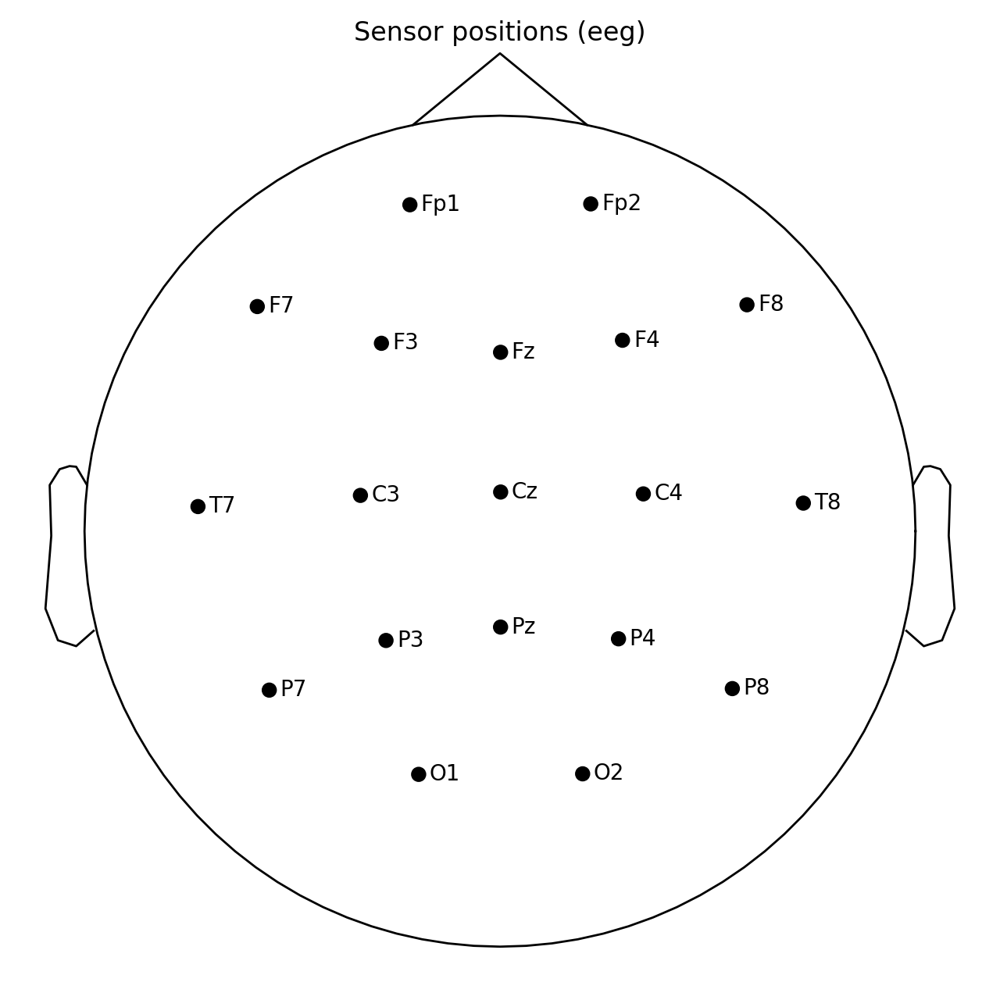

In [20]:
sample_1020.plot_sensors(show_names=True);

## Изучаем сигналы

<IPython.core.display.Javascript object>


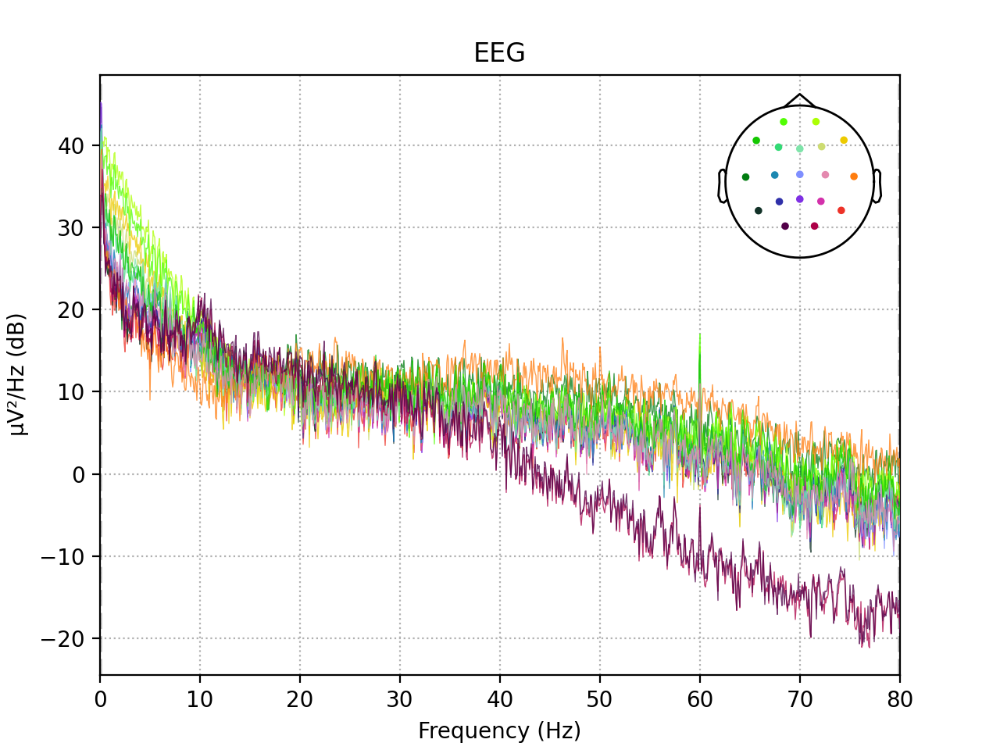

In [21]:
sample_1020.plot_psd();

### Band-pass filtering

It's better to remove low-freq components < 1 Hz and high-freq > 50Hz (non-informative for EEG)

Let's use 4-th order Butterworth filter (default IIR filter)

In [22]:
sample_1020.filter(l_freq=1, h_freq=50, method='iir')

<RawEDF | S003R03.edf, 19 x 20000 (125.0 s), ~3.0 MB, data loaded>

<IPython.core.display.Javascript object>


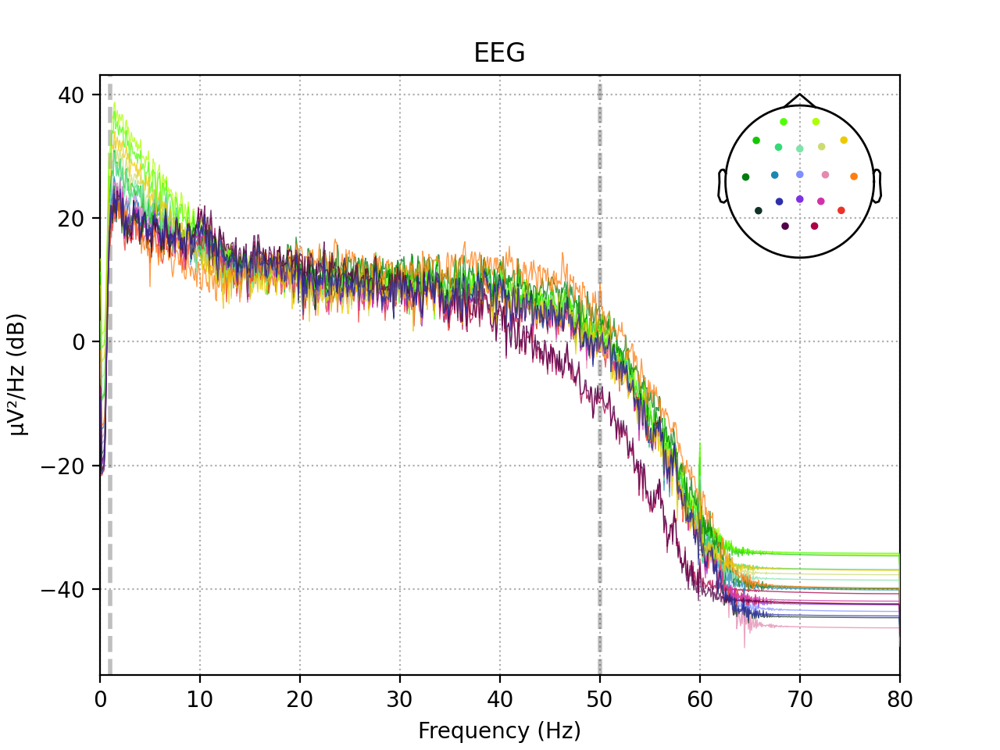

In [23]:
# Plot psd after filtering

# YOUR CODE HERE

sample_1020.plot_psd();

### Plot EEG signals

<IPython.core.display.Javascript object>


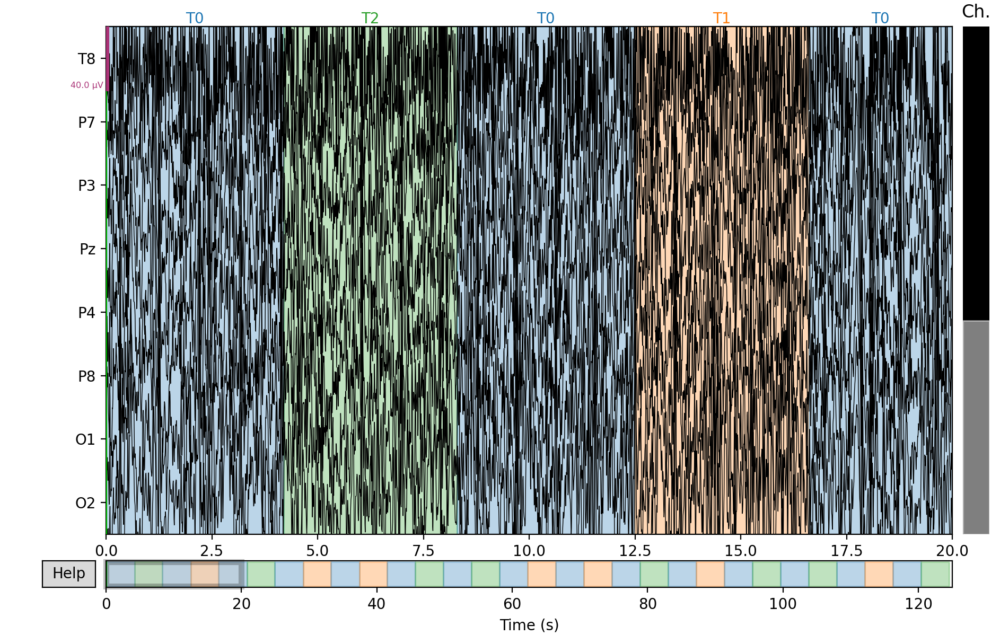

In [24]:
sample_1020.plot(n_channels=8, duration=20);

<IPython.core.display.Javascript object>


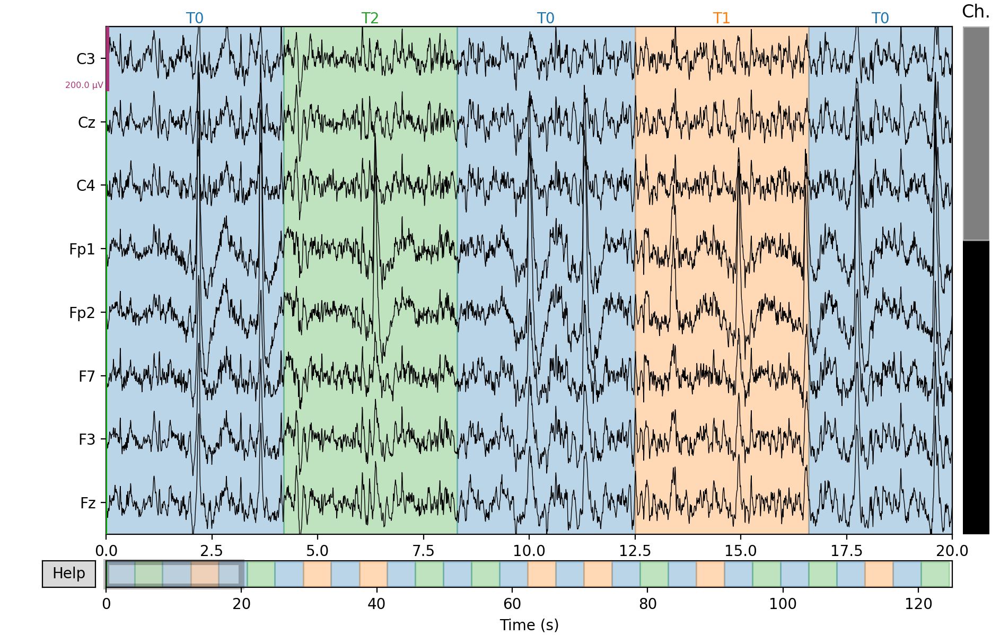

In [25]:
# Plot in better scale. Use 'scaling' argument

# Your code here

sample_1020.plot(n_channels=8, scalings={'eeg':1e-4}, duration=20);

## Extracting events

Mne has several functions for event selection. 

* `mne.find_events` is used when events are stored in trigger channels (e.g. FIFF format)
* `mne.events_from_annotations` is used for when events are stored in annotations (EDF+ format)
    
Look for documentation for your EEG-record format

Here we have EDF+ format

In [26]:
events, events_dict = mne.events_from_annotations(sample_1020)

Used Annotations descriptions: ['T0', 'T1', 'T2']


In [27]:
events_dict

{'T0': 1, 'T1': 2, 'T2': 3}

In [28]:
events[:5]

array([[   0,    0,    1],
       [ 672,    0,    3],
       [1328,    0,    1],
       [2000,    0,    2],
       [2656,    0,    1]])

In [29]:
epochs = mne.Epochs(sample_1020, events,  tmin=-0.5, tmax=0.8, preload=True)

30 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 30 events and 209 original time points ...
1 bad epochs dropped


In [30]:
pd.DataFrame(epochs.events, columns=['_', '__', 'event_id'])['event_id'].value_counts()

1    14
3     8
2     7
Name: event_id, dtype: int64

Check that length is right

In [31]:
for epoch in epochs:
    break
epoch.shape

(19, 209)

In [32]:
epoch.shape[1] / sample_1020.info['sfreq']

1.30625

In [33]:
sample_1020.to_data_frame().shape

(20000, 20)

In [34]:
df = epochs.to_data_frame()
df.head(3).iloc[:, :10]

,time,condition,epoch,C3,Cz,C4,Fp1,Fp2,F7,F3
0,-500,3,1,-4.547919,-1.344287,1.476721,236.675891,244.275703,125.936913,88.829681
1,-494,3,1,-4.844281,-12.002902,3.515891,175.970007,183.425016,103.803572,63.009365
2,-488,3,1,-2.909761,-11.900140,6.341468,127.095181,132.985975,61.669835,31.478465


<IPython.core.display.Javascript object>


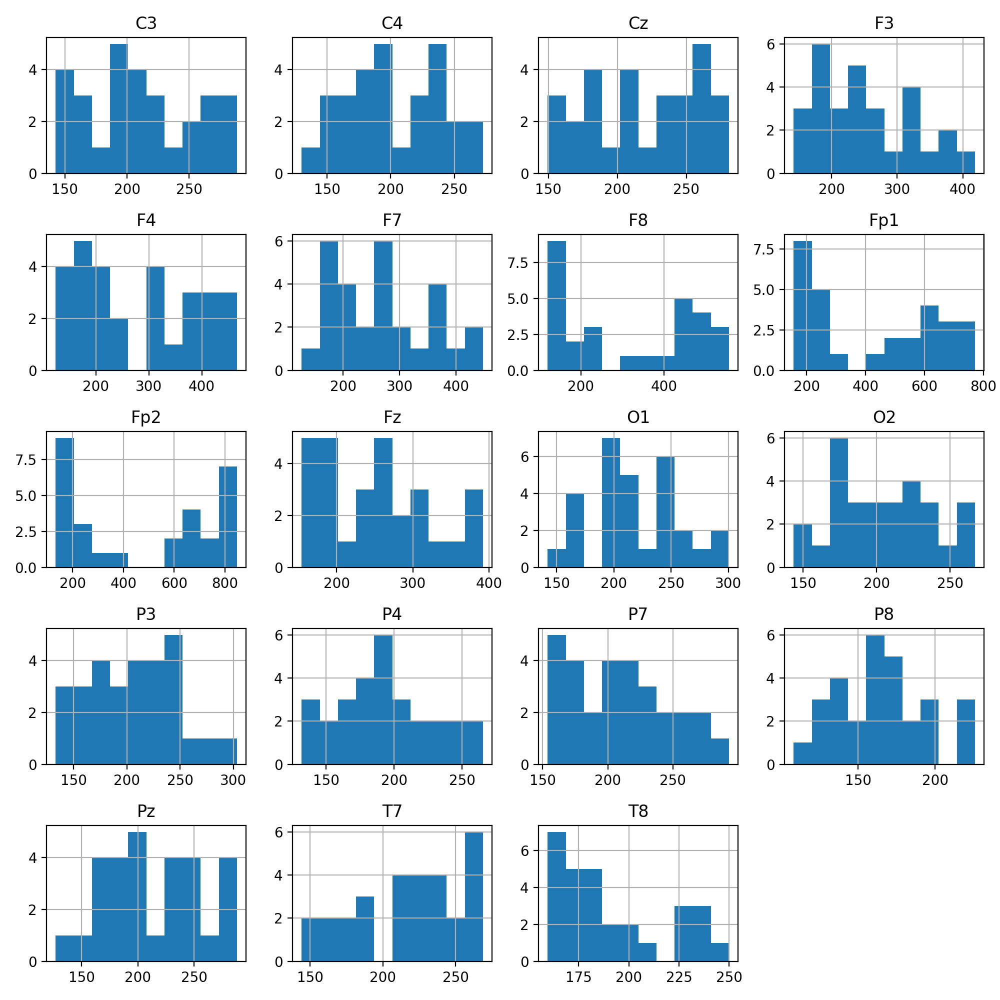

In [35]:
df[sample_1020.ch_names + ['epoch']].groupby('epoch').agg(lambda arr: arr.max() - arr.min()).hist(figsize=[10, 10]);
plt.tight_layout()

In [36]:
epochs = mne.Epochs(sample_1020, events,  tmin=-0.5, tmax=0.8, reject={'eeg': 600e-6}, preload=True, baseline=(-.1, 0))

30 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 30 events and 209 original time points ...
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
15 bad epochs dropped


PSD on epochs differs from the raw. More averaging is used

<IPython.core.display.Javascript object>


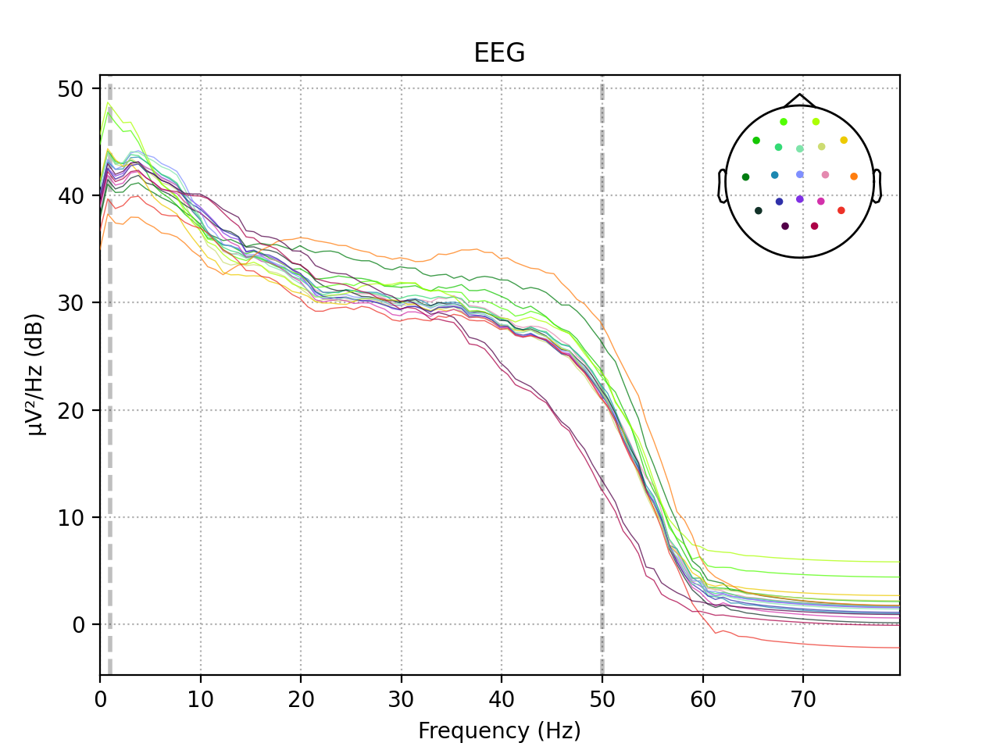

    Using multitaper spectrum estimation with 7 DPSS windows


In [37]:
epochs.plot_psd();

<IPython.core.display.Javascript object>


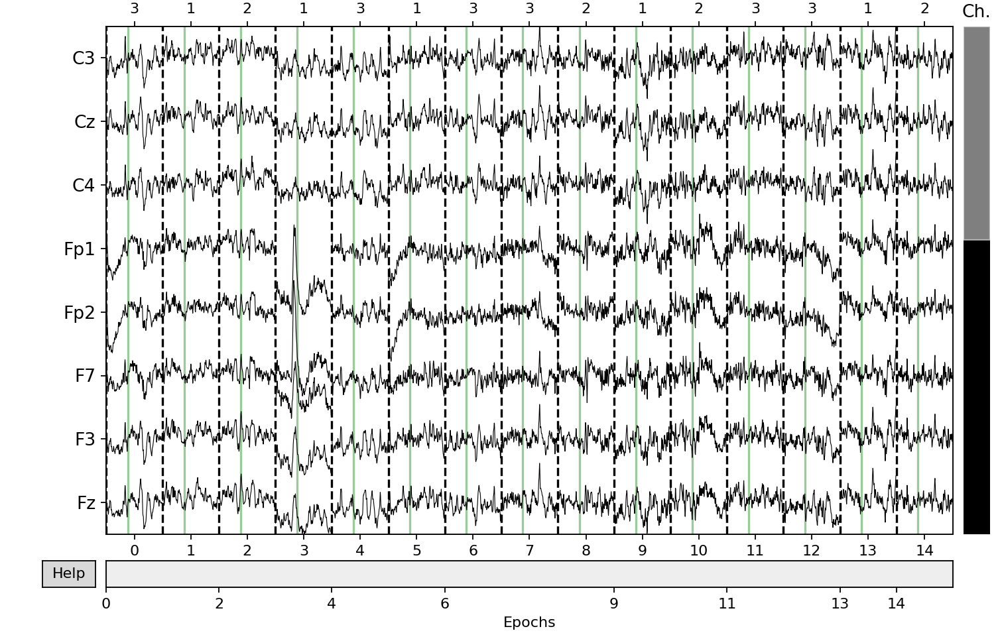

In [38]:
epochs.plot(n_channels=8, scalings={'eeg':1e-4});

In [39]:
epochs.event_id

{'1': 1, '2': 2, '3': 3}

In [40]:
# check number of events of each type
# use epochs.events

# Your code here

pd.DataFrame(epochs.events, columns=['_', '__', 'event_id'])['event_id'].value_counts()

3    6
1    5
2    4
Name: event_id, dtype: int64

In [41]:
evoked_T0 = epochs['1'].average()
evoked_T1 = epochs['2'].average()
evoked_T2 = epochs['3'].average()

<IPython.core.display.Javascript object>


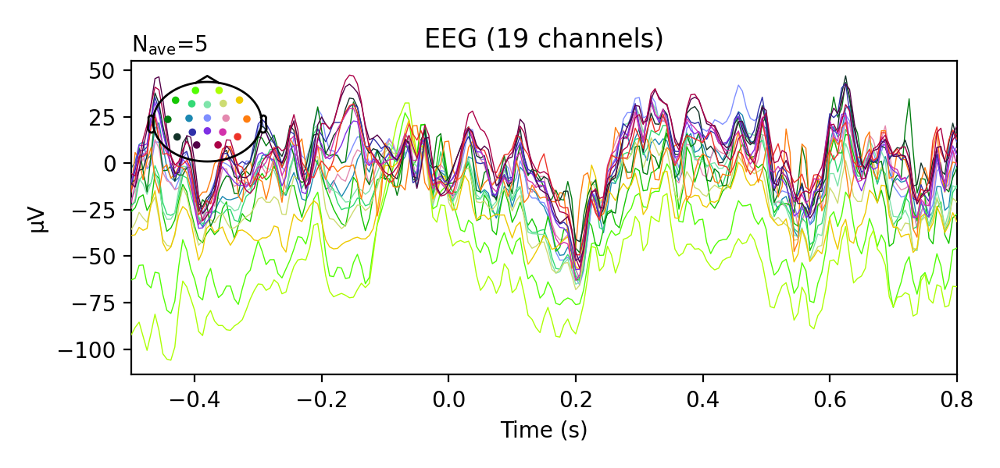

In [42]:
evoked_T0.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


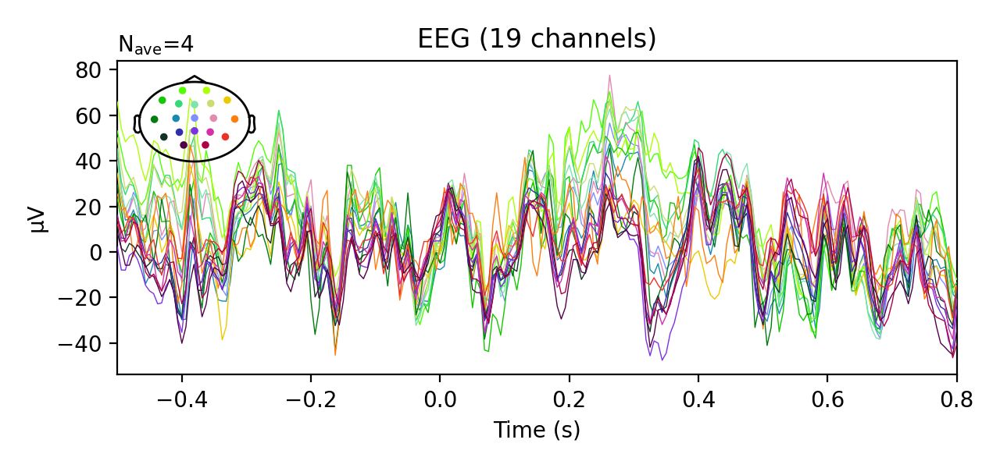

In [43]:
evoked_T1.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


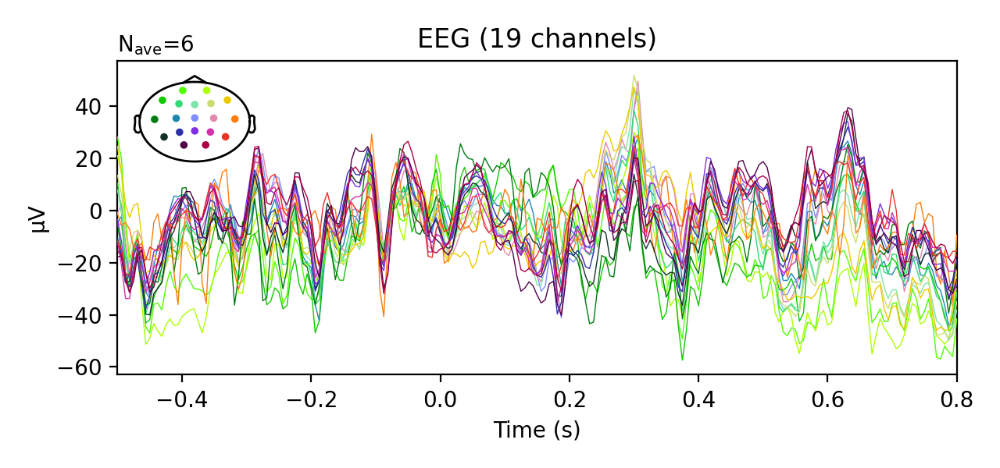

In [44]:
evoked_T2.plot(spatial_colors=True);

## Independent Component Analysis for Artifact Removal

In [45]:
ica = mne.preprocessing.ICA(n_components=10, random_state=42)

In [46]:
ica.fit(sample_1020)

Fitting ICA to data using 19 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 10 components
Fitting ICA took 0.2s.


<ICA  |  raw data decomposition, fit (fastica): 20000 samples, 10 components, channels used: "eeg">

<IPython.core.display.Javascript object>


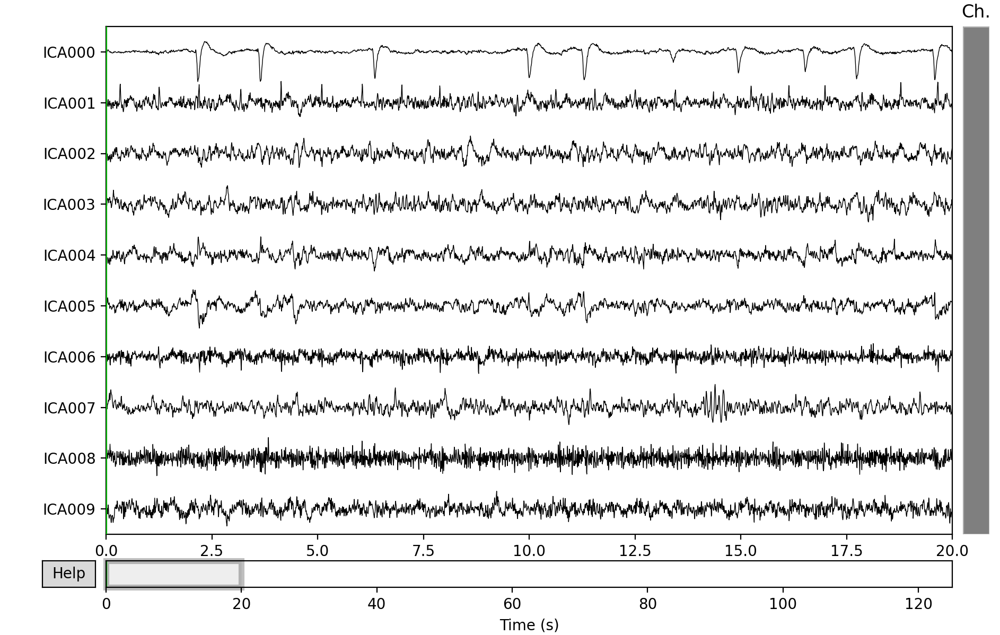

In [47]:
ica.plot_sources(sample_1020);

<IPython.core.display.Javascript object>


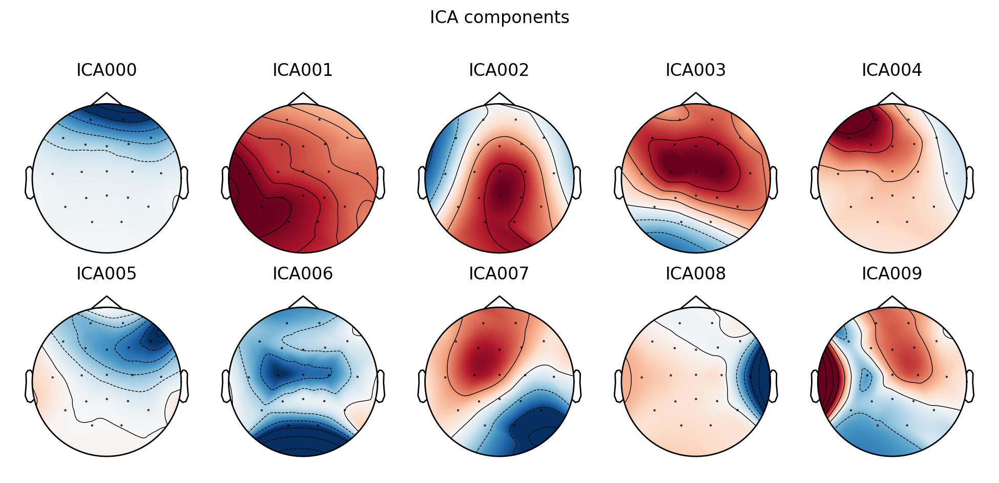

In [48]:
ica.plot_components();

Inspect ICA components more deeply. Check out spectrogram. Segments info is not very relevant here since we build ICA on the raw data

We expect to see alpha and beta rythms picks on the spectrogram for good components (7-13 Hz and 13-30Hz respectively). And also slight decrease as frequency goes higher

<IPython.core.display.Javascript object>


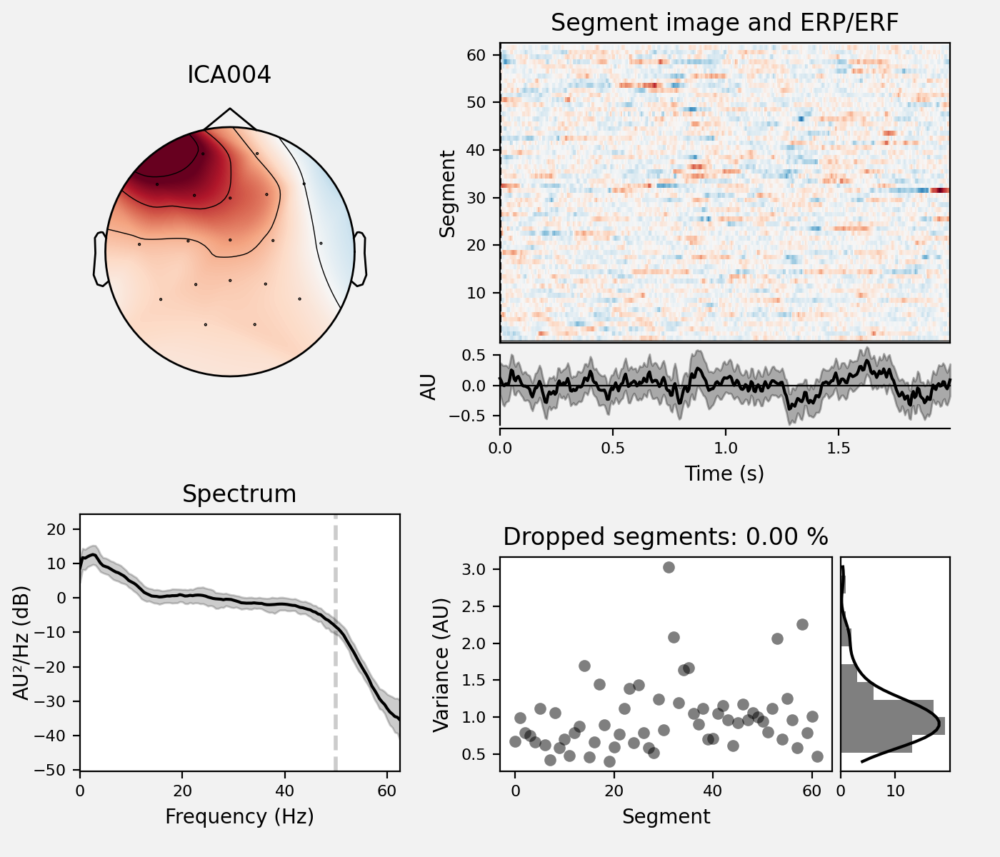

    Using multitaper spectrum estimation with 7 DPSS windows
62 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [49]:
ica.plot_properties(sample_1020, picks=[4]);

Transforming to ICA space (10 components)
Zeroing out 6 ICA components


<IPython.core.display.Javascript object>


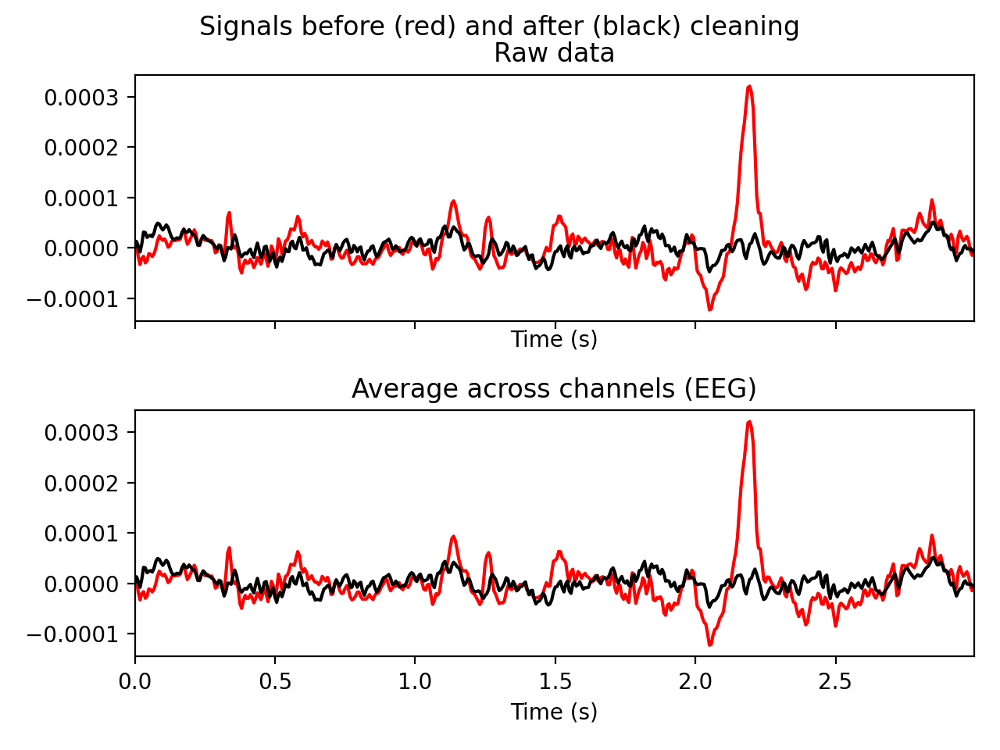

In [50]:
ica.plot_overlay(sample_1020, exclude=[0, 1, 4, 5, 8, 9], picks=['F3']);

In [51]:
ica.exclude = [0, 1]

In [52]:
sample_1020_clr = sample_1020.copy()

In [53]:
ica.apply(sample_1020_clr)

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


<RawEDF | S003R03.edf, 19 x 20000 (125.0 s), ~3.0 MB, data loaded>

<IPython.core.display.Javascript object>


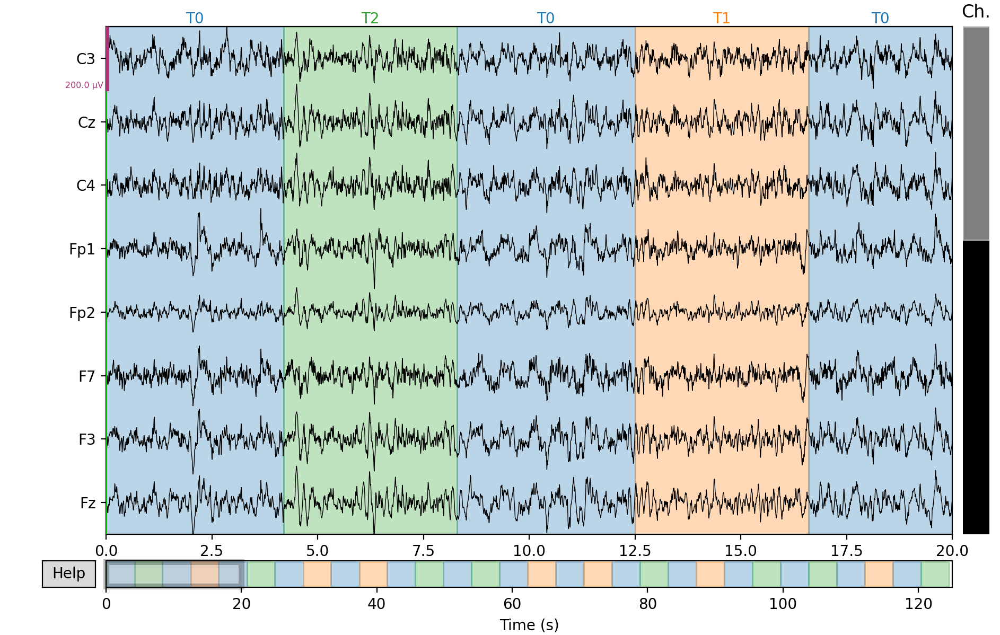

In [54]:
# plot channels

# YOUR CODE HERE

sample_1020_clr.plot(n_channels=8, scalings={'eeg':1e-4}, duration=20);

In [55]:
epochs = mne.Epochs(sample_1020_clr, events,  tmin=-0.5, tmax=0.8, reject={'eeg': 600e-6}, preload=True, baseline=(-.1, 0))


30 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 30 events and 209 original time points ...
1 bad epochs dropped


In [56]:
evoked_T0 = epochs['1'].average()
evoked_T1 = epochs['2'].average()
evoked_T2 = epochs['3'].average()

<IPython.core.display.Javascript object>


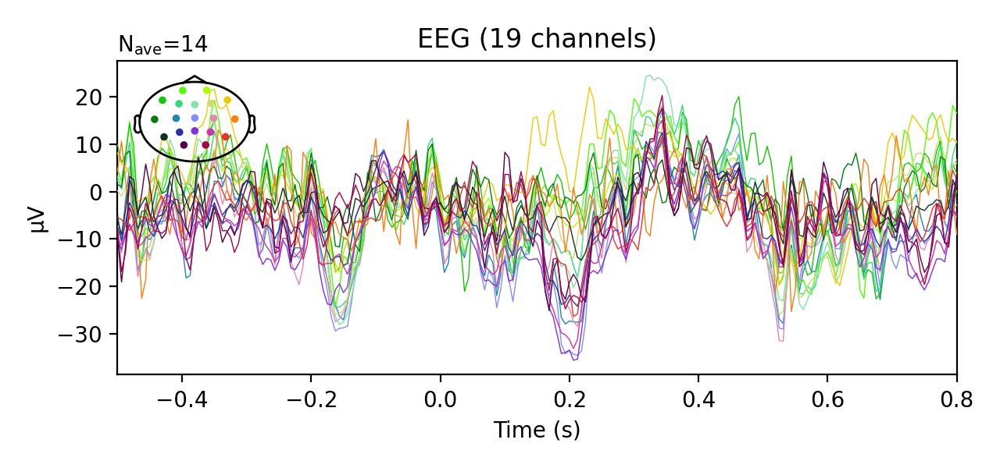

In [57]:
evoked_T0.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


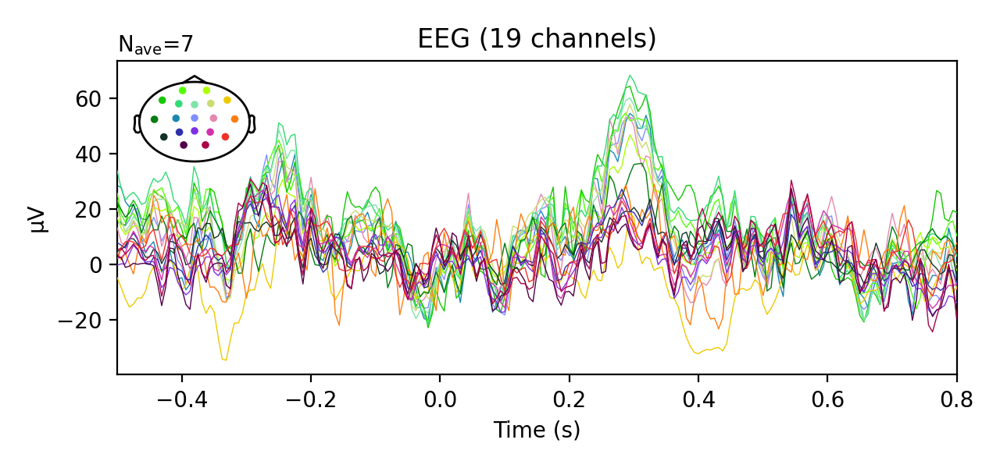

In [58]:
evoked_T1.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


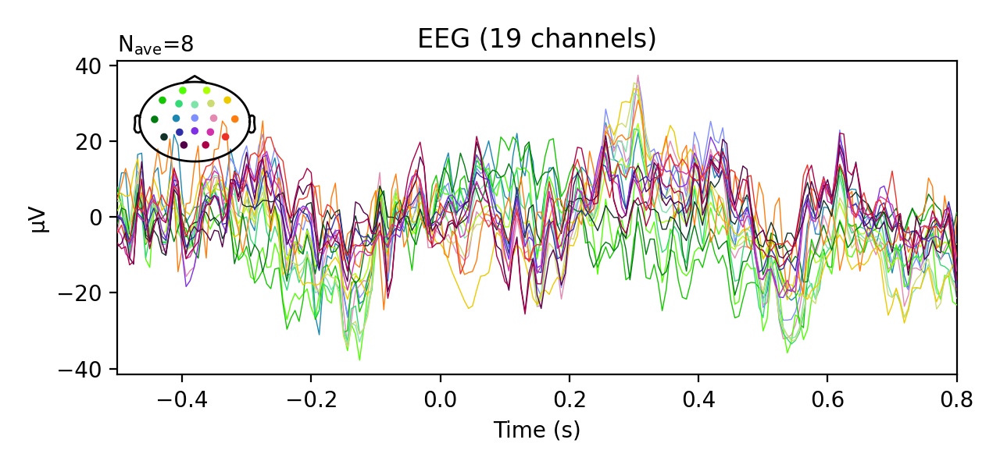

In [59]:
evoked_T2.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


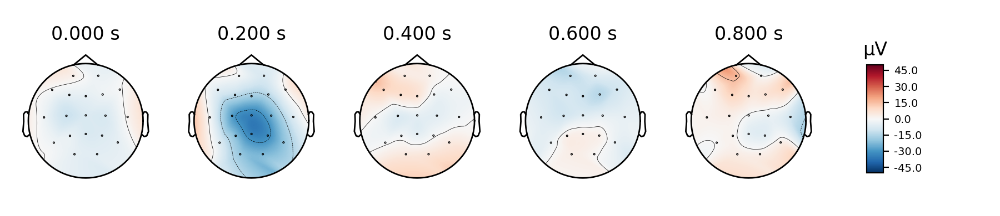

In [60]:
evoked_T0.plot_topomap(times=[0, .2, .4, .6, .8], vmin=-50, vmax=50);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


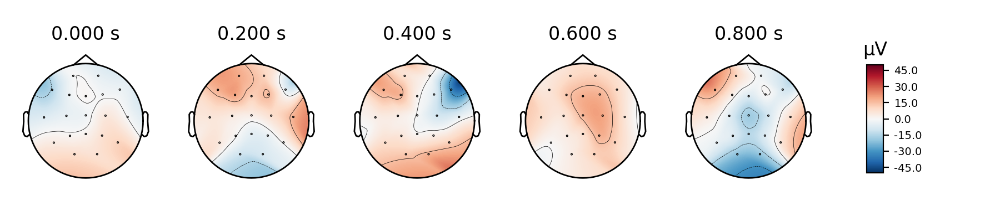

In [61]:
evoked_T1.plot_topomap(times=[0, .2, .4, .6, .8], vmin=-50, vmax=50);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


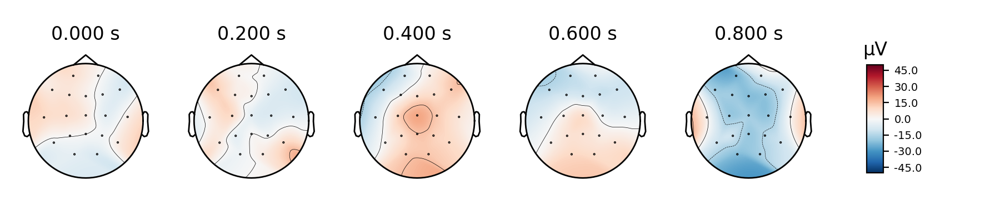

In [62]:
evoked_T2.plot_topomap(times=[0, .2, .4, .6, .8], vmin=-50, vmax=50);

## Dynamics of alpha and beta activity

In [63]:
evoked_T0_alpha = evoked_T0.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T1_alpha = evoked_T1.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T2_alpha = evoked_T2.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)


/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/evoked.py:300: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(len(ch_types_used), 1)


<IPython.core.display.Javascript object>


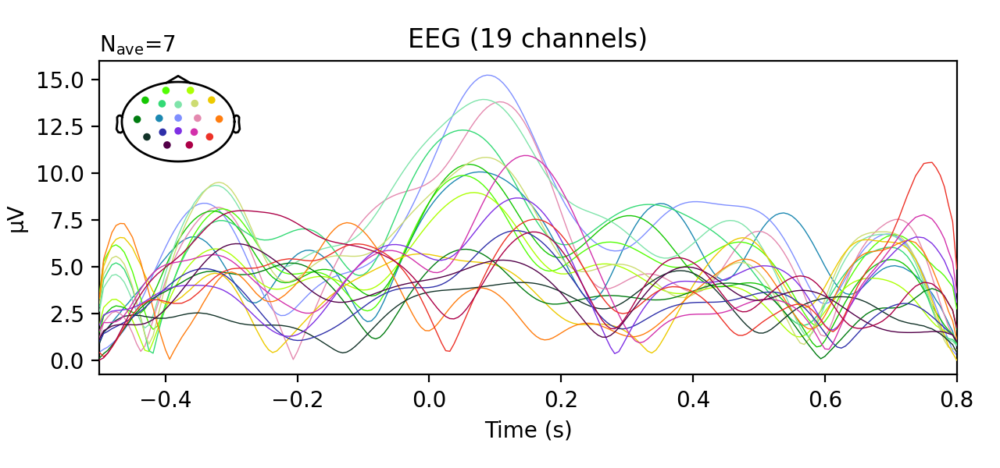

In [64]:
evoked_T1_alpha.plot(spatial_colors=True);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


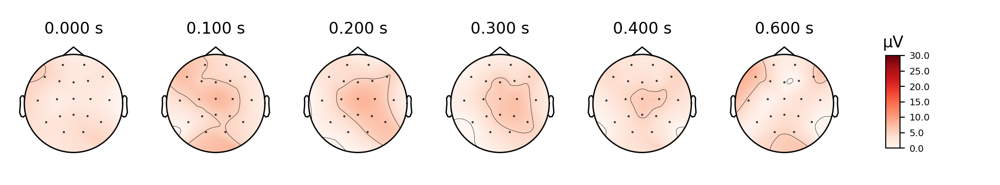

In [65]:
evoked_T0_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


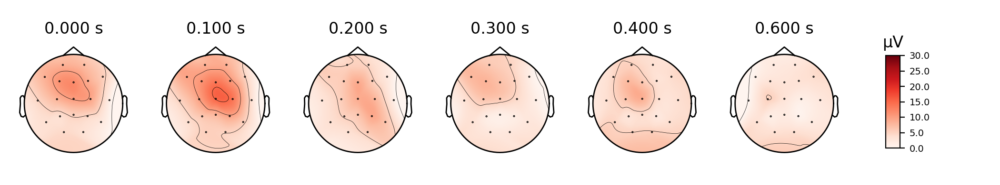

In [66]:
evoked_T1_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


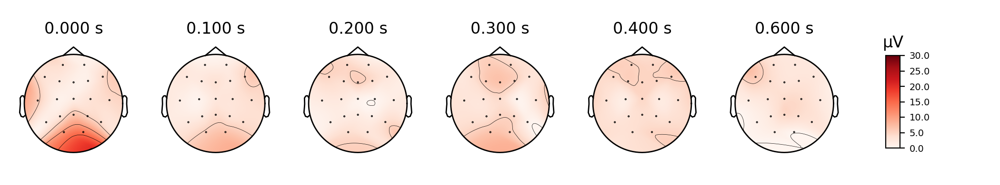

In [67]:
evoked_T2_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vmin=0, vmax=30);

In [68]:
evoked_T0_beta_low = evoked_T0.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T1_beta_low = evoked_T1.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T2_beta_low = evoked_T2.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)


/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


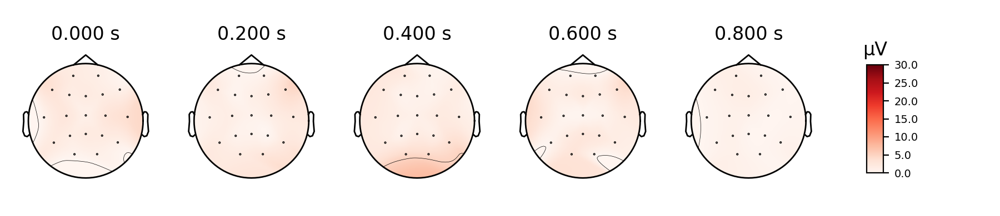

In [69]:
evoked_T0_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


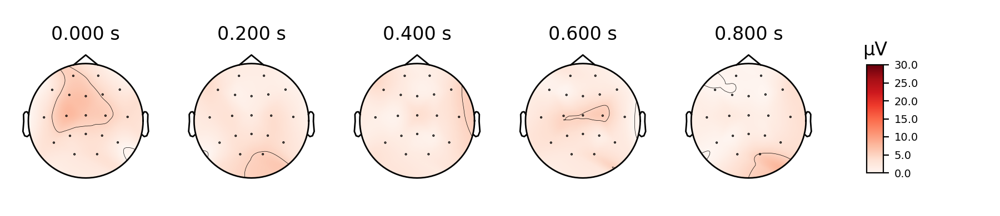

In [70]:
evoked_T1_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


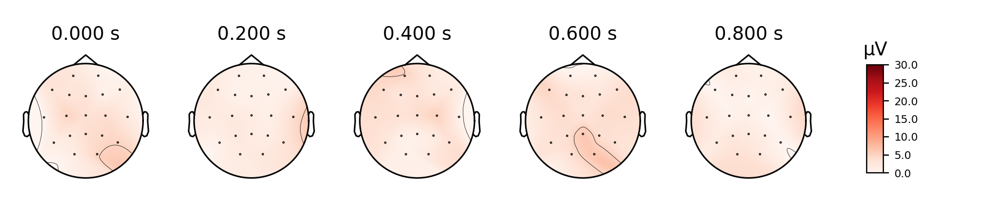

In [71]:
evoked_T2_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vmin=0, vmax=30);

## Computing functional connectivity

In [72]:
conn_T1, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['2'], method='coh')

Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 171 connections
    using t=0.000s..1.300s for estimation (209 points)
    frequencies: 4.6Hz..79.6Hz (99 points)
    Using multitaper spectrum estimation with 7 DPSS windows
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1
    computing connectivity for epoch 2
    computing connectivity for epoch 3
    computing connectivity for epoch 4
    computing connectivity for epoch 5
    computing connectivity for epoch 6
    computing connectivity for epoch 7
    assembling connectivity matrix (filling the upper triangular region of the matrix)
[Connectivity computation done]


In [73]:
def plot_topomap_connectivity_2d(info, con, picks=None, pairs=None, vmin=None, vmax=None, cm=None, show_values=False, show_names=True):
    """
    Plots connectivity-like data in 2d
    
    Drawing every pair of channels will likely make a mess
    There are two options to avoid it:
    - provide picks
    - provide specific pairs of channels to draw
    """
    
    # get positions
    _, pos, _, _, _, _, _ = mne.viz.topomap._prepare_topomap_plot(info, 'eeg');
    
#     if picks is None and pairs is None:
#         picks = info.ch_names
    
    ch_names_lower = [ch.lower() for ch in info.ch_names]
    if picks:
        picks_lower = [ch.lower() for ch in picks]
    if pairs:
        pairs_lower = [tuple(sorted([ch1.lower(), ch2.lower()])) for ch1, ch2 in pairs]
    
    rows = []
    for idx1, ch1 in enumerate(ch_names_lower):
        for idx2, ch2 in enumerate(ch_names_lower):
            if ch1 >= ch2:
                continue
            if picks and (ch1 not in picks_lower or ch2 not in picks_lower):
                    continue
            if pairs and (ch1, ch2) not in pairs_lower:
                    continue
            rows.append((
                pos[idx1],
                pos[idx2],
                con[idx1, idx2]
            ))
    
    if not len(rows):
        raise ValueError('No pairs to plot')
    
    con_to_plot = np.array([row[2] for row in rows])
    if vmin is None:
        vmin = np.percentile(con_to_plot, 2)
    if vmax is None:
        vmax = np.percentile(con_to_plot, 98)
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    
    if cm is None:
        cm = sns.diverging_palette(240, 10, as_cmap=True)
    
    fig, ax = plt.subplots(figsize=[5, 5])
    mne.viz.utils.plot_sensors(info, show_names=show_names, show=False, axes=ax);
    for row in rows:
        rgba_color = cm(norm(row[2]))
        plt.plot([row[0][0], row[1][0]], [row[0][1], row[1][1]], color=rgba_color)
        if show_values:
            plt.text((row[0][0] + row[1][0]) / 2, 
                     (row[0][1] + row[1][1]) / 2, 
                     '{:.2f}'.format(row[2]))

In [74]:
conn_T0, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['1'], method='coh', verbose=False);
conn_T1, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['2'], method='coh', verbose=False);
conn_T2, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['3'], method='coh', verbose=False);

In [75]:
freqs

array([ 4.59330144,  5.35885167,  6.12440191,  6.88995215,  7.65550239,
        8.42105263,  9.18660287,  9.95215311, 10.71770335, 11.48325359,
       12.24880383, 13.01435407, 13.77990431, 14.54545455, 15.31100478,
       16.07655502, 16.84210526, 17.6076555 , 18.37320574, 19.13875598,
       19.90430622, 20.66985646, 21.4354067 , 22.20095694, 22.96650718,
       23.73205742, 24.49760766, 25.26315789, 26.02870813, 26.79425837,
       27.55980861, 28.32535885, 29.09090909, 29.85645933, 30.62200957,
       31.38755981, 32.15311005, 32.91866029, 33.68421053, 34.44976077,
       35.215311  , 35.98086124, 36.74641148, 37.51196172, 38.27751196,
       39.0430622 , 39.80861244, 40.57416268, 41.33971292, 42.10526316,
       42.8708134 , 43.63636364, 44.40191388, 45.16746411, 45.93301435,
       46.69856459, 47.46411483, 48.22966507, 48.99521531, 49.76076555,
       50.52631579, 51.29186603, 52.05741627, 52.82296651, 53.58851675,
       54.35406699, 55.11961722, 55.88516746, 56.6507177 , 57.41

In [76]:
conn_T0_beta = conn_T0[:, :, 12:27].mean(axis=2)
conn_T0_beta = conn_T0_beta + conn_T0_beta.T

conn_T1_beta = conn_T1[:, :, 12:27].mean(axis=2)
conn_T1_beta = conn_T1_beta + conn_T1_beta.T

conn_T2_beta = conn_T2[:, :, 12:27].mean(axis=2)
conn_T2_beta = conn_T2_beta + conn_T2_beta.T

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


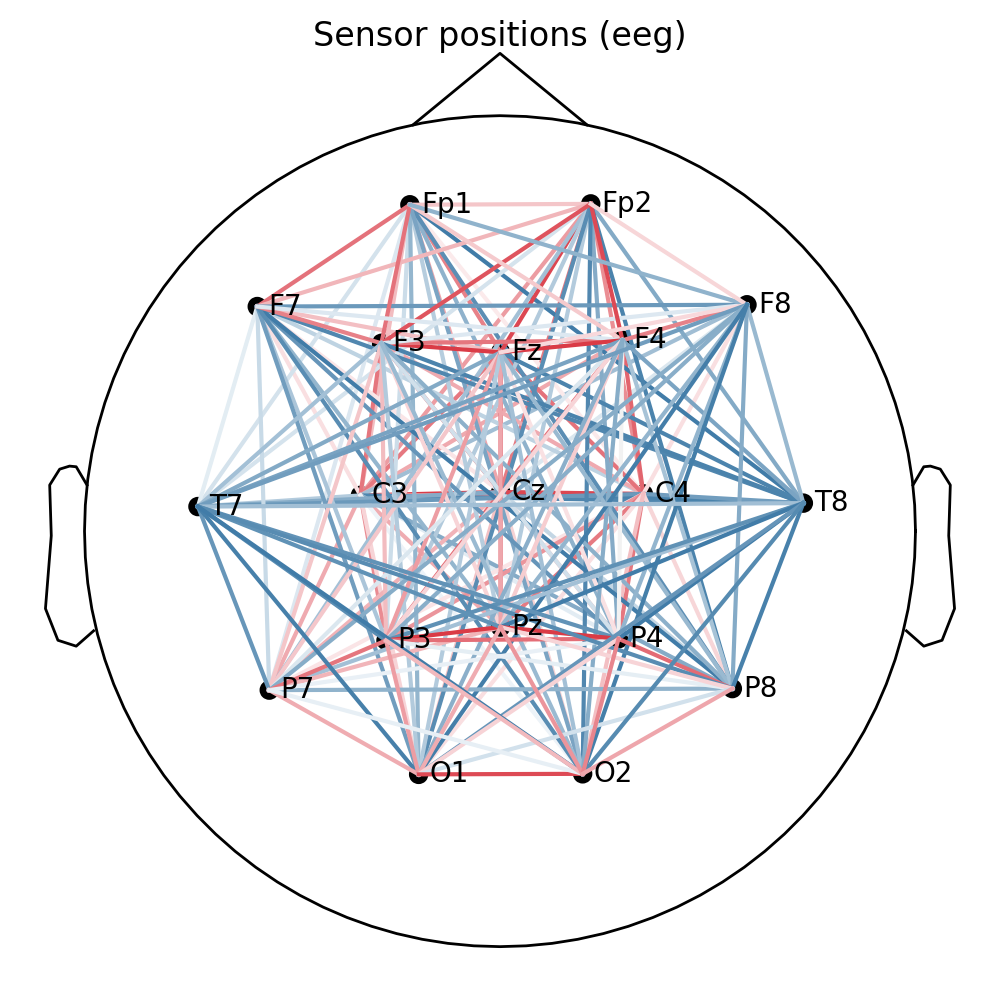

In [77]:
plot_topomap_connectivity_2d(epochs.info, conn_T1_beta, picks=epochs.ch_names);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


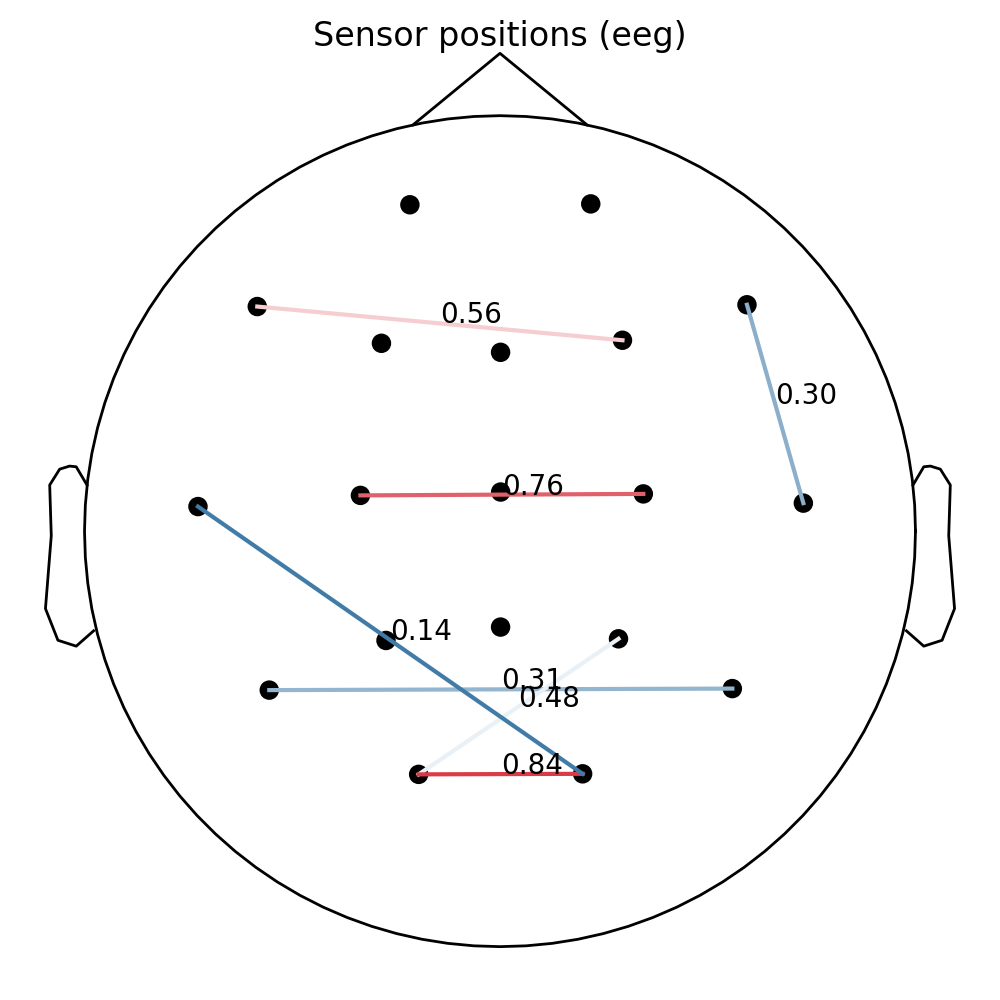

In [78]:
plot_topomap_connectivity_2d(epochs.info, conn_T0_beta, 
                             pairs=[('F7', 'F4'), ('O2', 'T7'), ('C3', 'C4'), ('P7', 'P8'), ('F8', 'T8'), ('O1', 'O2'), ('O1', 'P4')],
                             show_values=True,
                             show_names=False
                            
                            );


/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


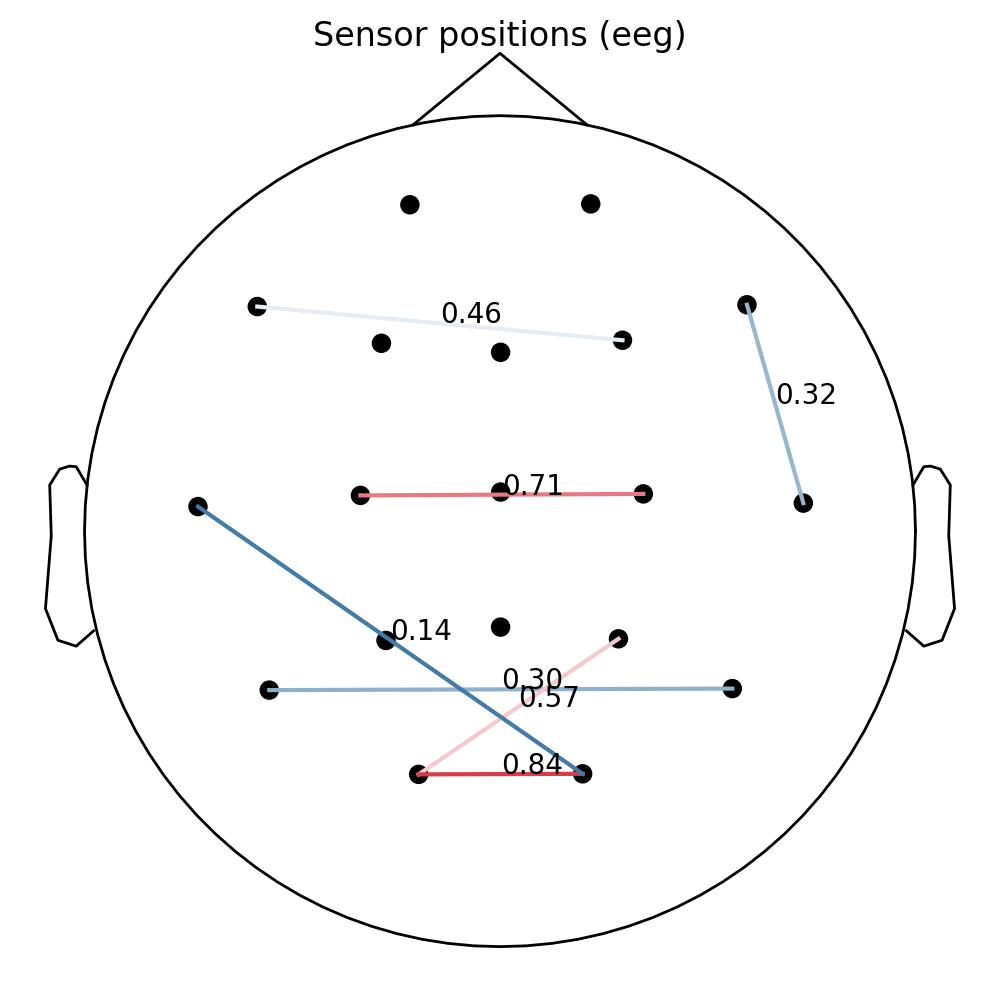

In [79]:
# calculate coherence in alpha band
# plot 5-10 pairs that you are interested in

conn_T0_alpha = conn_T0[:, :, 7:13].mean(axis=2)
conn_T0_alpha = conn_T0_alpha + conn_T0_alpha.T

conn_T1_alpha = conn_T1[:, :, 7:13].mean(axis=2)
conn_T1_alpha = conn_T1_alpha + conn_T1_alpha.T

conn_T2_alpha = conn_T2[:, :, 7:13].mean(axis=2)
conn_T2_alpha = conn_T2_alpha + conn_T2_alpha.T




plot_topomap_connectivity_2d(epochs.info, conn_T1_beta, 
                             pairs=[('F7', 'F4'), ('O2', 'T7'), ('C3', 'C4'), ('P7', 'P8'), ('F8', 'T8'), ('O1', 'O2'), ('O1', 'P4')],
                             show_values=True,
                             show_names=False
                            
                            );
